In [1]:
import numpy as np
import pandas as pd
import scanpy.api as sc
import matplotlib.pyplot as plt

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, color_map='viridis')# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.figdir = './figures/endo/'
adata = sc.read("C:/Users/seowjjw/Dropbox/Liver_Paper/Github/data/endo_73k.h5ad")

import scvelo as scv
import loompy
import scanpy as sc
scv.logging.print_version()

C:\ProgramData\Anaconda3\lib\site-packages\anndata\base.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.4 anndata==0.6.19 numpy==1.17.4 scipy==1.1.0 pandas==1.1.2 scikit-learn==0.21.3 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 
Running scvelo 0.1.24 (python 3.7.1) on 2020-09-17 16:40.


In [2]:
adata

AnnData object with n_obs × n_vars = 11672 × 2608 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'patient_id', 'patient_tumorsection', 'NormalvsTumor', 'patientno', 'PNC', 'PIC', 'ViralvsNonViral', 'mean genes exp', 'median genes exp'
    var: 'gene_ids', 'n_cells'
    uns: 'NormalvsTumor_colors', 'PNC_colors', 'ViralvsNonViral_colors', 'louvain', 'louvain_colors', 'neighbors', 'patientno_colors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

saving figure to file ./figures/endo/umap_louvain.png


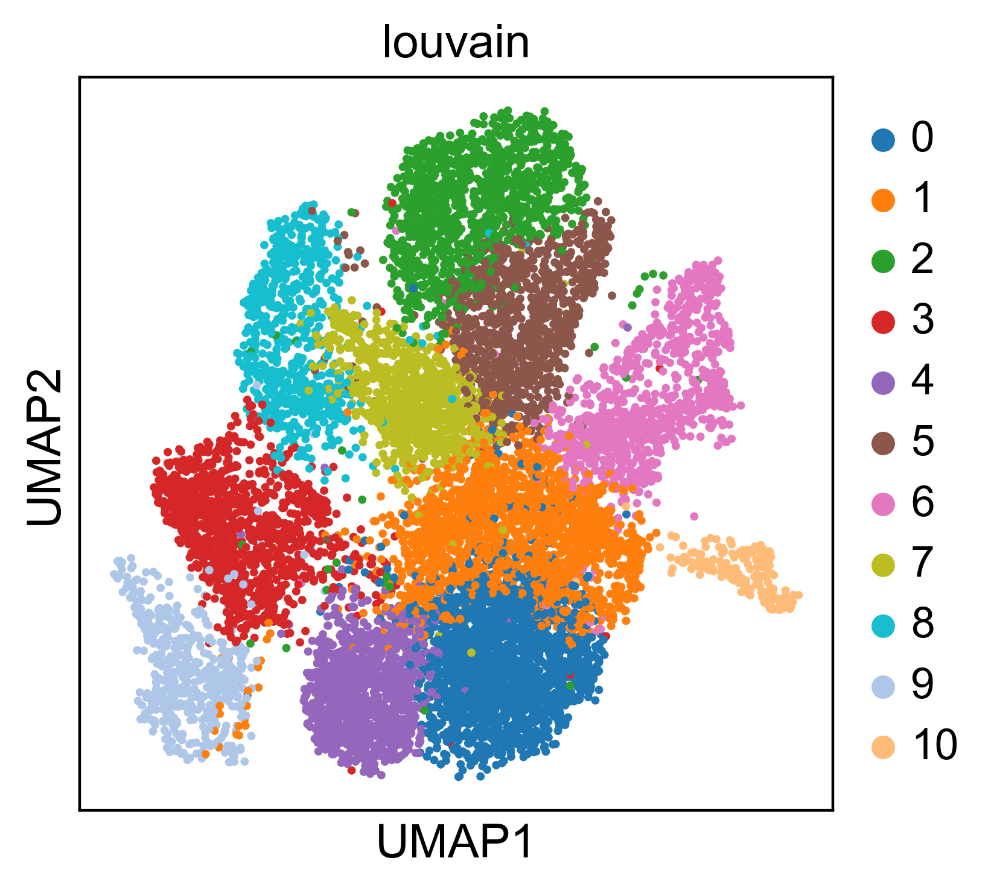

In [3]:
sc.settings.set_figure_params(dpi=200, color_map='viridis')
sc.pl.umap(adata, color='louvain',size=25, save='_louvain.png')

In [4]:
adata.var_names_make_unique()
adata.obs_names_make_unique()

In [5]:
ldata = scv.read('livermerged_2.loom', cache=True)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


In [6]:
ldata.var_names_make_unique()
ldata.obs_names_make_unique()

In [7]:
adata = scv.utils.merge(adata, ldata)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [8]:
scv.utils.show_proportions(adata)
adata

Abundance of ['spliced', 'unspliced', 'ambiguous']: [0.54 0.4  0.06]


AnnData object with n_obs × n_vars = 9252 × 2608 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'patient_id', 'patient_tumorsection', 'NormalvsTumor', 'patientno', 'PNC', 'PIC', 'ViralvsNonViral', 'mean genes exp', 'median genes exp', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'gene_ids', 'n_cells', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'NormalvsTumor_colors', 'PNC_colors', 'ViralvsNonViral_colors', 'louvain', 'louvain_colors', 'neighbors', 'patientno_colors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [9]:
scv.pp.moments(adata)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:12) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


In [10]:
scv.tl.velocity(adata)

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [11]:
scv.tl.velocity_graph(adata)

computing velocity graph
    finished (0:00:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


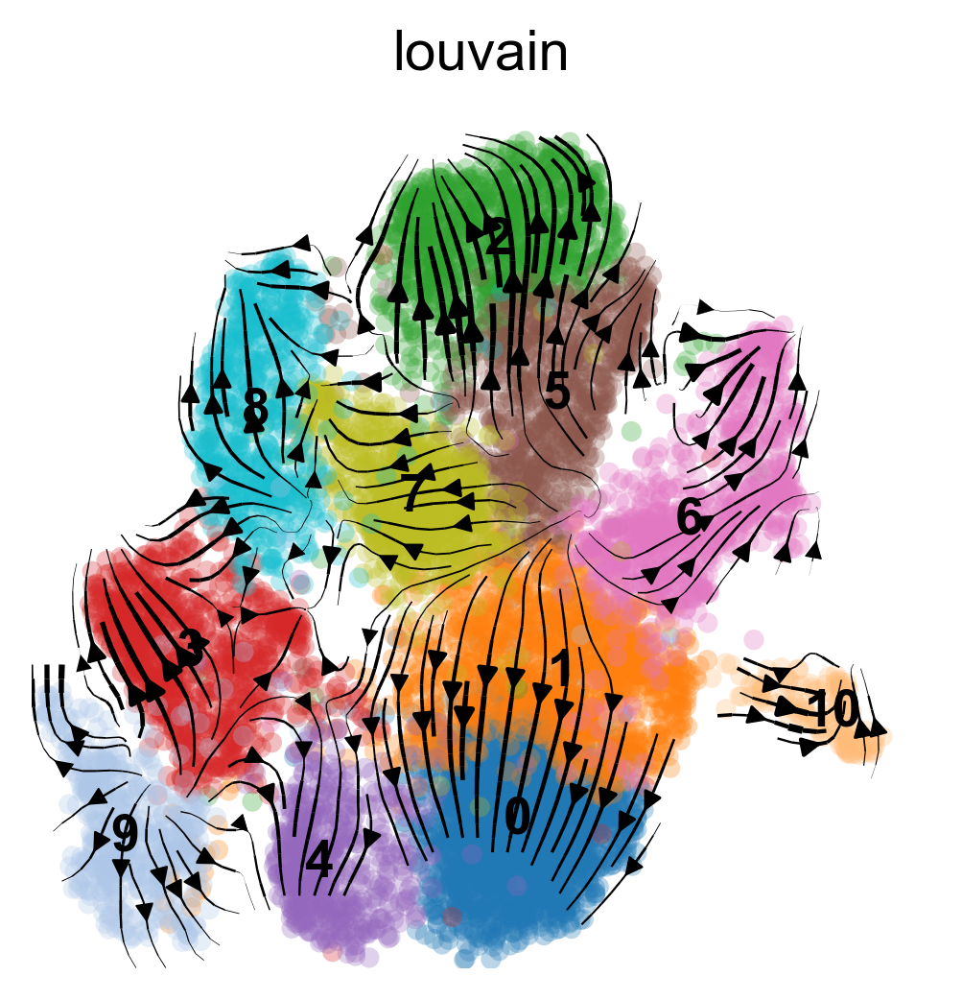

In [12]:
scv.pl.velocity_embedding_stream(adata, layer=['velocity'], color=['louvain'],
                               dpi = 150, use_raw = True, legend_loc = None)

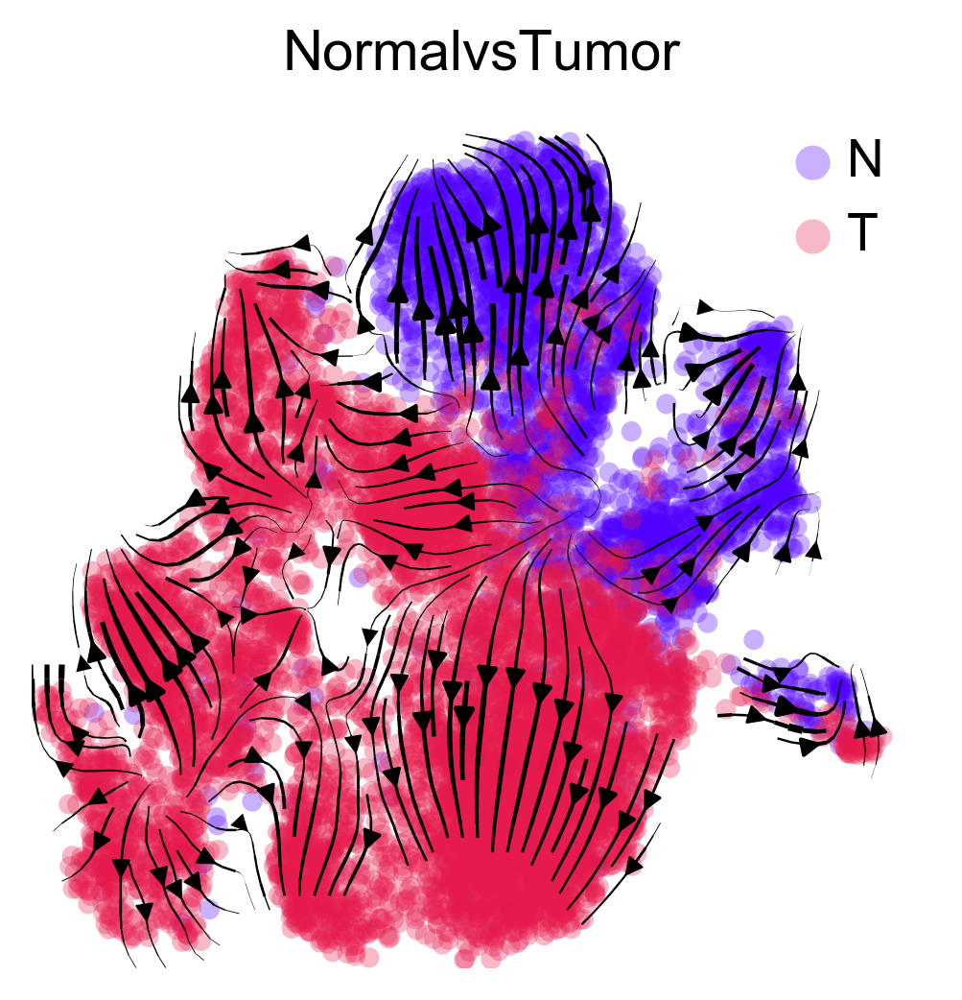

In [13]:
scv.pl.velocity_embedding_stream(adata, layer=['velocity'], color=['NormalvsTumor'],
                               dpi = 150, use_raw = True, legend_loc = None)

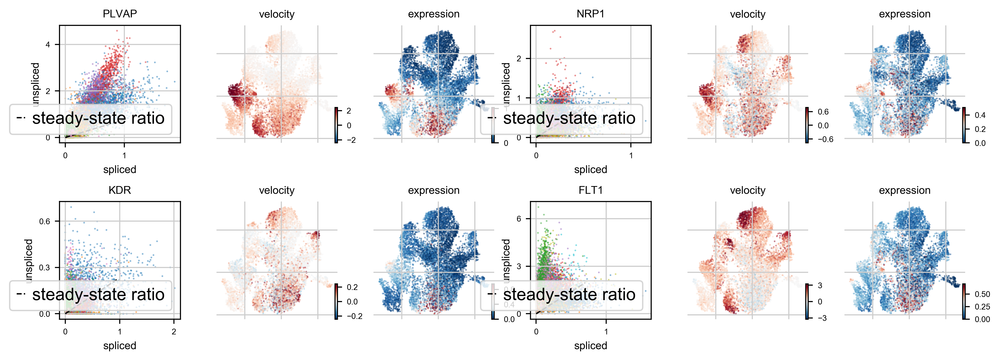

In [14]:
var_names = ['PLVAP', 'NRP1', 'KDR', 'FLT1']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, fontsize=8)

In [15]:
scv.settings.set_figure_params('scvelo') 

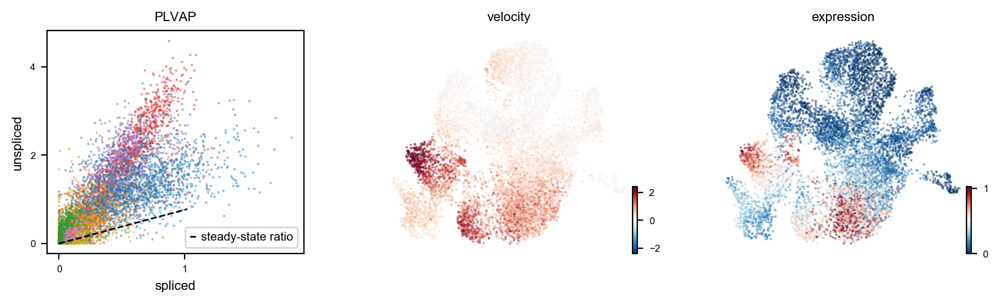

In [16]:
var_names=['PLVAP']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2)

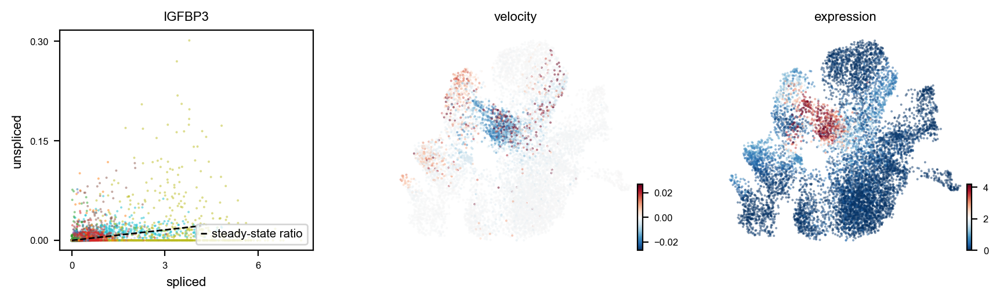

In [17]:
var_names=['IGFBP3']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2 )

In [ ]:
var_names=['PLPP3']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, save ='hcc_scvelo_PLPP3_endo_ss.pdf' )

saving figure to file ./figures/scvelo_hcc_scvelo_PLPP3_endo_ss.pdf


In [ ]:
var_names=['TFF3']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, save='hcc_scvelo_TFF3_endo_ss.pdf')

In [ ]:
var_names=['HLA-DRA']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, save='hcc_scvelo_KDR_endo_ss.pdf')

saving figure to file ./figures/scvelo_hcc_scvelo_KDR_endo_ss.pdf


In [ ]:
var_names=['FLT1']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, save='hcc_scvelo_FLT1_endo_ss.pdf')

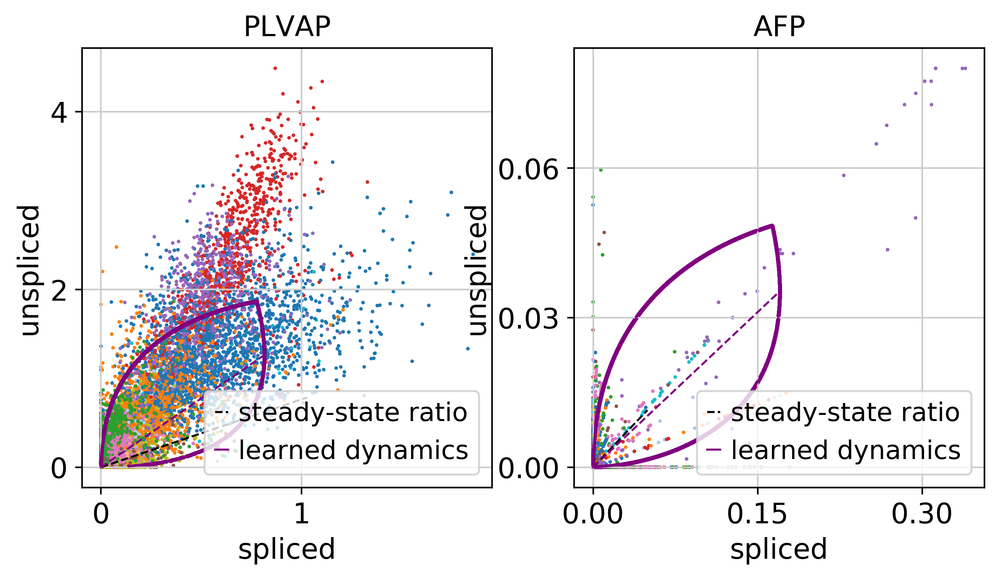

In [20]:
scv.pl.scatter(adata, basis=['PLVAP', 'AFP'])

saving figure to file ./figures/scvelo_scvelo_hcc_endo_dynamic.png


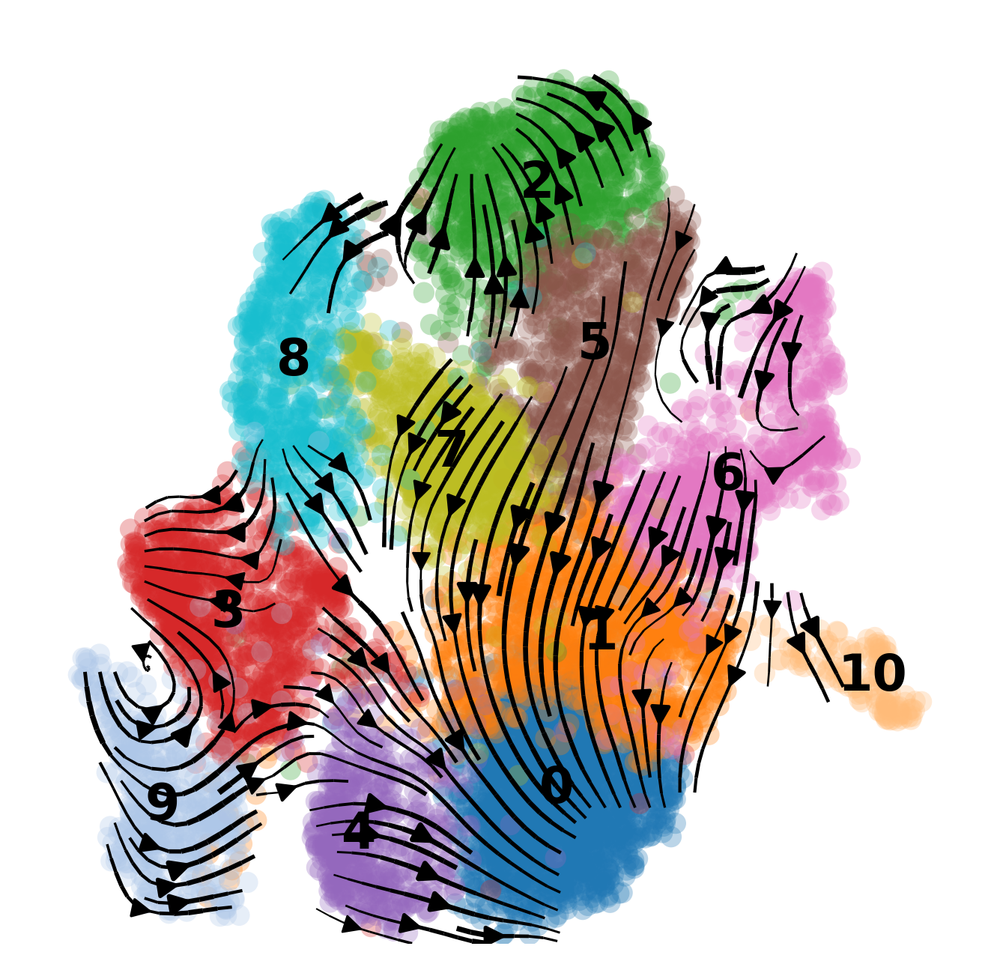

In [32]:
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_fontsize=12, title='', smooth=.8, min_mass=4, save='scvelo_hcc_endo_dynamic.png')

In [18]:
adata.write("C:/Users/seowjjw/Dropbox/Liver_Paper/Github/data/endo_73k.h5ad")
